#### Esplorative Data Analysis
###### Packages

In [2]:
import matplotlib.pyplot as plt
from math import pi
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn import preprocessing, model_selection
from sklearn import decomposition
from sklearn.model_selection import train_test_split
from sklearn import metrics
from matplotlib import rcParams
from matplotlib import pyplot

#### Info Dataset
###### The Dataset is composed by 177783 (before 377368) instances and 42 (before 43) features
###### 

In [3]:
df = pd.read_csv(r"Churn_Banking_competition.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177783 entries, 0 to 177782
Data columns (total 42 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Id_Cliente                           177783 non-null  int64  
 1   Imp_Valore_del_Cliente               177781 non-null  float64
 2   Flag_Apertura_Conto_Online           177783 non-null  int64  
 3   Flag_Possesso_piu_Conti              177783 non-null  int64  
 4   Eta                                  177782 non-null  float64
 5   Provincia_Domicilio                  167658 non-null  object 
 6   Provincia_Residenza                  168460 non-null  object 
 7   Anno_Apertura_primo_Conto            177783 non-null  float64
 8   Professione                          160796 non-null  object 
 9   Imp_Reddito                          73812 non-null   object 
 10  Tipologia_Cliente                    177781 non-null  object 
 11  Sesso        

###### The new dataset has the all same features of the old one

In [7]:
df_old = pd.read_csv(r"Churn_Banking_Modeling.csv")
common_columns = df.columns.intersection(df_old.columns)
n_common_columns = len(common_columns)
print('Common columns: ',common_columns)
print('Number of common columns:',n_common_columns)

Common columns:  Index(['Id_Cliente', 'Imp_Valore_del_Cliente', 'Flag_Apertura_Conto_Online',
       'Flag_Possesso_piu_Conti', 'Eta', 'Provincia_Domicilio',
       'Provincia_Residenza', 'Anno_Apertura_primo_Conto', 'Professione',
       'Imp_Reddito', 'Tipologia_Cliente', 'Sesso', 'Profilo_MIFID',
       'Imp_Canone_Pricing_cc', 'Imp_Bonifici_vs_Competitors',
       'Imp_Bonifici_vs_No_Competitors', 'Num_Utenze_in_essere',
       'Flag_Accredito_Stipendio', 'Imp_Spending_Carta_Credito',
       'Imp_Spending_Bancomat', 'Num_Accessi_Sito',
       'Num_Movimenti_Dispositivi', 'Num_attivit�_trading',
       'Var_Numero_Utenze', 'Flag_Mutuo', 'Flag_Prestito', 'Flag_Giroconto',
       'Flag_Richiesta_info_chiusura_conto', 'Iscrizione_programma_Loyalty',
       'Flag_Contatto_Call_Center', 'Flag_variazione_Accredito_Stipendio',
       'Num_Punti_Programma_Loyalty', 'Imp_Liquidit�_Attuale',
       'Imp_Gestito_attuale', 'Imp_Amministrato_attuale',
       'Imp_Liquidit�_Attuale_6m', 'Imp_Gest

###### Categorical Features dtype transformation in the type object

In [8]:
for col in df.columns:
    if col.startswith('Flag'):
        df[col] = df[col].astype('object')


numeric_variables_count = len(df.select_dtypes(include=['number']).columns)
categorical_variables_count = len(df.select_dtypes(include=['object']).columns)

print("number of numeric features",numeric_variables_count)
print("number of categorical features",categorical_variables_count)
print(df.info())

number of numeric features 22
number of categorical features 20
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177783 entries, 0 to 177782
Data columns (total 42 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Id_Cliente                           177783 non-null  int64  
 1   Imp_Valore_del_Cliente               177781 non-null  float64
 2   Flag_Apertura_Conto_Online           177783 non-null  object 
 3   Flag_Possesso_piu_Conti              177783 non-null  object 
 4   Eta                                  177782 non-null  float64
 5   Provincia_Domicilio                  167658 non-null  object 
 6   Provincia_Residenza                  168460 non-null  object 
 7   Anno_Apertura_primo_Conto            177783 non-null  float64
 8   Professione                          160796 non-null  object 
 9   Imp_Reddito                          73812 non-null   object 
 10  Tipologia_Client

#### Missing Values
###### There are a lot of missing values for some instances, but the usage of particular Machine Learning techniques allowed us to not treat them, since this work will be done by the algorithm itself
###### The old dataset and the new dataset have almost the same percentage of missing values

In [16]:
# Calcola i valori mancanti per df e df_old
missing_values_count = df.isnull().sum()
missing_values_count_old = df_old.isnull().sum()

# Calcola i valori mancanti per df e df_old
missing_values_count = df.isnull().sum()
missing_values_count_old = df_old.isnull().sum()

# Crea un nuovo dataframe per la tabella
missing_values_table = pd.DataFrame({
    'Nome della variabile': df.columns.union(df_old.columns),  # Unione dei nomi delle colonne di df e df_old
    'Valori mancanti per df': [missing_values_count.get(col, 0) for col in df.columns.union(df_old.columns)],
    'Valori mancanti per df_old': [missing_values_count_old.get(col, 0) for col in df.columns.union(df_old.columns)]
})

# Stampa la tabella
for index, row in missing_values_table.iterrows():
    print(f"{row['Nome della variabile']}: {row['Valori mancanti per df']} (df) | {row['Valori mancanti per df_old']} (df_old)")

Anno_Apertura_primo_Conto: 0 (df) | 0 (df_old)
Eta: 1 (df) | 7 (df_old)
Flag_Accredito_Stipendio: 0 (df) | 0 (df_old)
Flag_Apertura_Conto_Online: 0 (df) | 0 (df_old)
Flag_Contatto_Call_Center: 0 (df) | 0 (df_old)
Flag_Disattivazione_RID: 0 (df) | 0 (df_old)
Flag_Giroconto: 0 (df) | 0 (df_old)
Flag_Mutuo: 0 (df) | 0 (df_old)
Flag_Possesso_piu_Conti: 0 (df) | 0 (df_old)
Flag_Prestito: 0 (df) | 0 (df_old)
Flag_Richiesta_Estinzione_cc: 0 (df) | 0 (df_old)
Flag_Richiesta_info_chiusura_conto: 0 (df) | 0 (df_old)
Flag_Rifiuto_Carte: 0 (df) | 0 (df_old)
Flag_Rifiuto_Prestiti: 0 (df) | 0 (df_old)
Flag_Trasferimento_Titoli_Out: 0 (df) | 0 (df_old)
Flag_variazione_Accredito_Stipendio: 103971 (df) | 219893 (df_old)
Id_Cliente: 0 (df) | 0 (df_old)
Imp_Amministrato_attuale: 89635 (df) | 189735 (df_old)
Imp_Amministrato_attuale_6m: 90243 (df) | 191071 (df_old)
Imp_Bonifici_vs_Competitors: 135555 (df) | 288655 (df_old)
Imp_Bonifici_vs_No_Competitors: 82931 (df) | 176679 (df_old)
Imp_Canone_Pricing_cc:

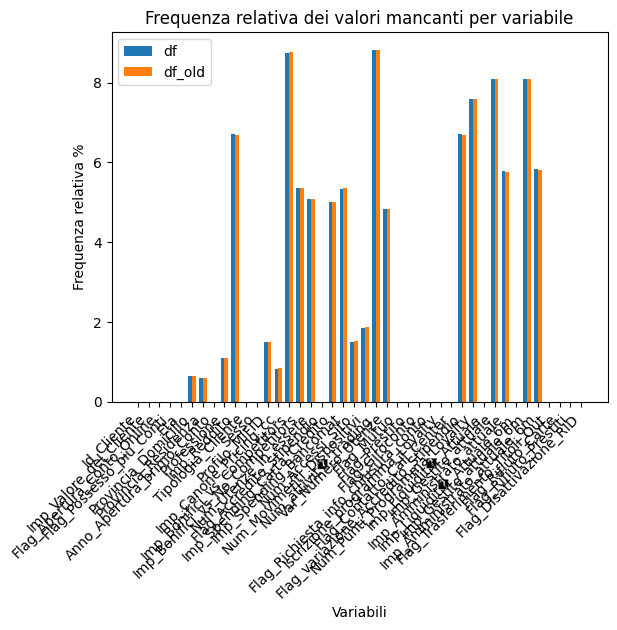

In [24]:
# Calcola il numero totale di valori mancanti per df e df_old
numero_valori_mancanti_totale_df = df.isnull().sum().sum()
numero_valori_mancanti_totale_df_old = df_old.isnull().sum().sum()

# Calcola le frequenze relative dei valori mancanti per ogni variabile
frequenze_relative_df = (df[df.columns.intersection(df_old.columns)].isnull().sum() / numero_valori_mancanti_totale_df) * 100
frequenze_relative_df_old = (df_old[df.columns.intersection(df_old.columns)].isnull().sum() / numero_valori_mancanti_totale_df_old) * 100

# Seleziona solo le colonne comuni ai due dataframe
columns = df.columns.intersection(df_old.columns)

# Prepara i dati per il grafico
variabili = columns.tolist()
frequenze_relative_na_df = frequenze_relative_df.tolist()
frequenze_relative_na_df_old = frequenze_relative_df_old.tolist()

# Crea il grafico a doppia barra
x = range(len(variabili))
larghezza_barre = 0.35

fig, ax = plt.subplots()
bar1 = ax.bar(x, frequenze_relative_na_df, larghezza_barre, label='df')
bar2 = ax.bar([i + larghezza_barre for i in x], frequenze_relative_na_df_old, larghezza_barre, label='df_old')

ax.set_xlabel('Variabili')
ax.set_ylabel('Frequenza relativa %')
ax.set_title('Frequenza relativa dei valori mancanti per variabile')
ax.set_xticks([i + larghezza_barre / 2 for i in x])
ax.set_xticklabels(variabili, rotation=45, ha='right')
ax.legend()

plt.show()

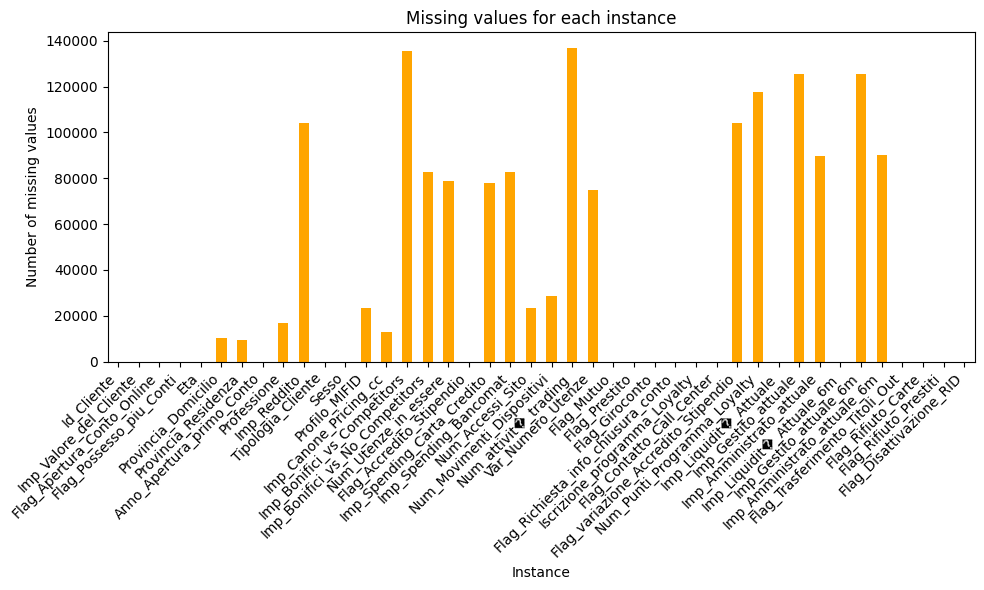

In [5]:
plt.figure(figsize=(10, 6))
missing_values_count.plot(kind='bar',color="orange")
plt.title('Missing values for each instance')
plt.xlabel('Instance')
plt.ylabel('Number of missing values')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
missing_values_count_old.plot(kind='bar',color="orange")
plt.title('Missing values for each instance')
plt.xlabel('Instance')
plt.ylabel('Number of missing values')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### Univariate Analysis for categorical features


###### The features with the prefix 'Flag' indicate the presence or the absence of the described chracteristic 
###### Flag_Apertura_Conto_Online, the 23% of customers opened an online a bank account.
###### Most customers work as "Impiegato" and "Libero professionista/Titolare di impresa".
###### Most customers are Bankers o Investitors, they represent togheter the 90% of customers.
###### The frequence of these features is the same for the new and the old dataset

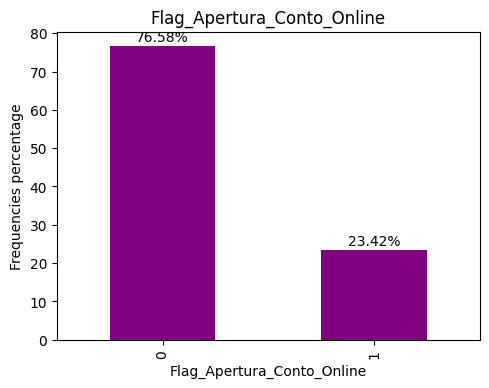

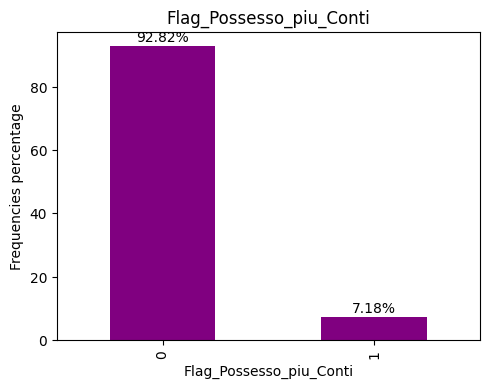

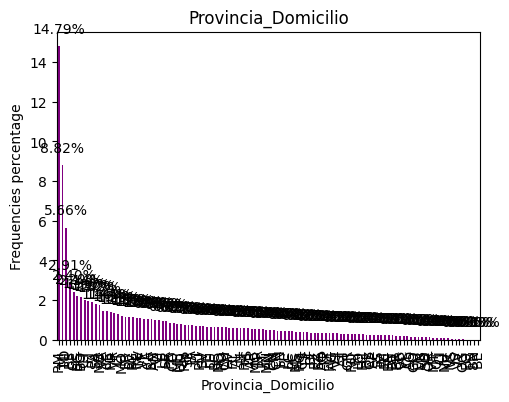

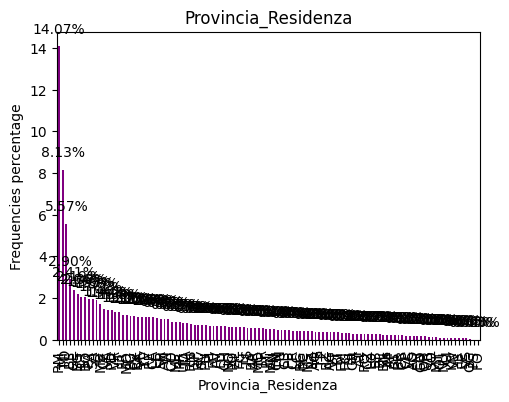

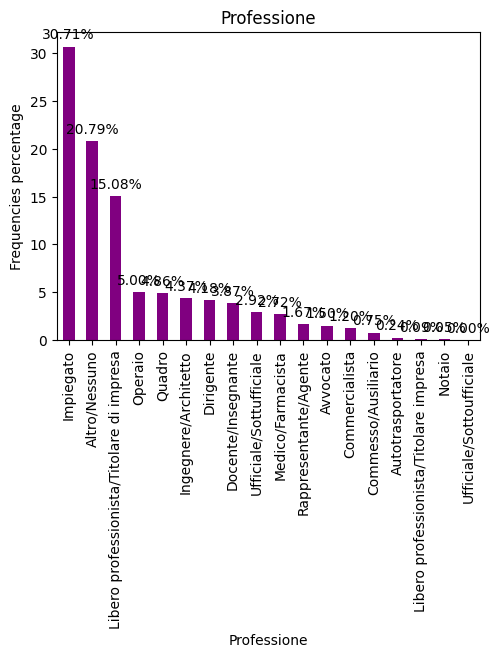

...

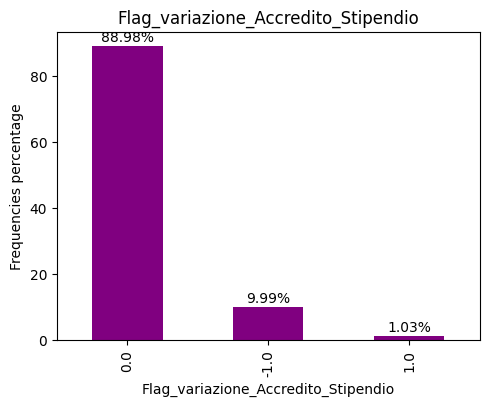

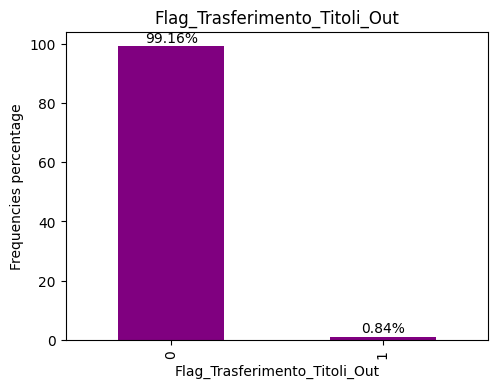

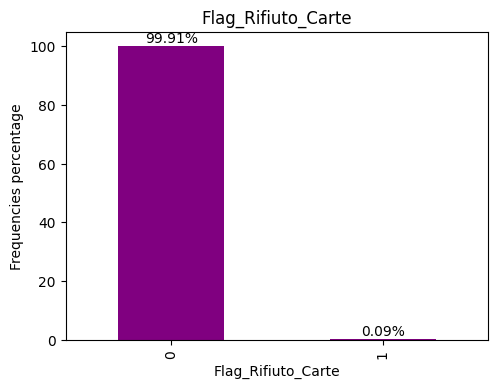

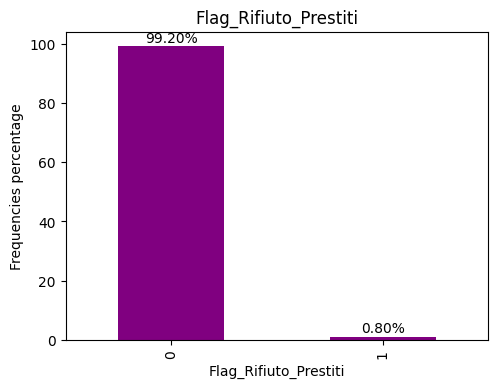

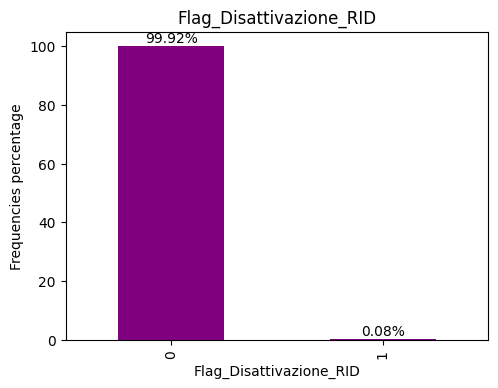

In [ ]:
cat_var = df.select_dtypes(include=["object"]).columns.drop("Flag_Richiesta_Estinzione_cc")


for column in cat_var:
    plt.figure(figsize=(12, 4))
    plt.subplot(121)
    
    relative_freq = df[column].value_counts(normalize=True)
    
    percent_freq = relative_freq * 100
    percent_freq.plot(kind="bar", color="purple")
    plt.xlabel(column)
    plt.ylabel("Frequencies percentage")
    plt.title(column)
    
    
    for i, v in enumerate(percent_freq):
        plt.text(i, v + 0.5, f'{v:.2f}%', ha='center', va='bottom')
    
    plt.show()



#### Univariate analysis of numerical features
###### Some features have a strong asymettric distribution, so later we will consider the possibility to use the logaritmic scale. For example, Bonifici_vs_no_Competitors has a lot of values next to 0.

In [ ]:
import plotly.express as px

fig = px.histogram(df, x='Imp_Bonifici_vs_Competitors')
# Layout
fig.update_layout(
    xaxis_title='Value',
    yaxis_title='Frequence',
)
fig.show()

In [ ]:
import plotly.express as px

fig = px.histogram(df, x='Imp_Bonifici_vs_No_Competitors')

# Layout
fig.update_layout(
    xaxis_title='Valore',
    yaxis_title='Frequenza',
)
fig.show()

###### Imp_Valore_del_Cliente has a lot of zeros

In [ ]:
print('Numero di 0 per la variabile Imp_Valore_del_Cliente',df.loc[df['Imp_Valore_del_Cliente']==0.00,'Imp_Valore_del_Cliente'].count())
# Crea un istogramma orizzontale per una variabile specifica (ad esempio 'NomeVariabile')
fig = px.histogram(df, x='Imp_Valore_del_Cliente')

# Imposta il layout del grafico
fig.update_layout(
    xaxis_title='Valore',
    yaxis_title='Frequenza',
)
# Mostra il grafico
fig.show()

Numero di 0 per la variabile Imp_Valore_del_Cliente 7798


#### Bivariate Analysis of numerical features
###### There are some features strictly correlated, in particular 'Imp_Amministrato_attuale' and 'Imp_Amministrato_attuale_6m' have a correlation over 0.9: very high. This was obvious in teory too since they explain the same thing in different time.
###### Imp_Gestito_attuale and Imp_attuale have higher values for customers who decide not to leave their account 


<Axes: >

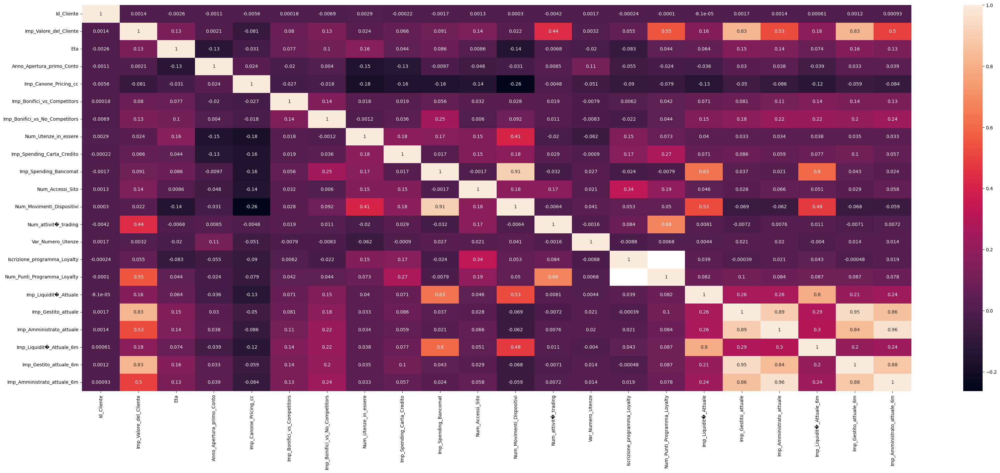

In [ ]:
numeric_df= df.select_dtypes(include=['int64','float64'])
plt.figure(figsize=(40,15))
sns.heatmap(numeric_df.corr(),annot=True)